# Analisis exploratorio

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
import plotly.express as px

In [2]:
df = pd.read_csv("analisis-exploratorio/data/sleep_cycle_productivity.csv")
df.head(10)


,Date,Person_ID,Age,Gender,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
0,2024-04-12,1860,32,Other,23.33,4.61,5.28,3,86,87,116,8.808920,8,3,6
1,2024-11-04,1769,41,Female,21.02,2.43,5.41,5,32,21,88,6.329833,10,3,7
2,2024-08-31,2528,20,Male,22.10,3.45,5.35,7,17,88,59,8.506306,10,9,10
3,2024-02-22,8041,37,Other,23.10,6.65,7.55,8,46,34,80,6.070240,8,4,2
4,2024-02-23,4843,46,Other,21.42,4.17,6.75,10,61,269,94,11.374994,8,7,9
5,2024-07-08,7439,38,Male,21.77,6.41,8.64,10,88,251,123,6.207993,1,9,7
6,2024-01-09,6463,18,Other,22.83,6.87,8.03,3,34,288,122,4.592357,7,10,9
7,2024-01-28,7278,26,Female,20.78,3.14,6.35,8,36,98,171,9.100460,3,1,3
8,2024-04-10,9110,31,Other,20.07,3.37,7.31,7,26,206,14,4.887127,3,7,1
9,2024-02-21,6116,49,Female,20.37,3.89,7.52,4,12,159,70,6.318012,6,2,10


In [3]:
resumen = df.describe()
resumen

,Person_ID,Age,Sleep Start Time,Sleep End Time,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score,Mood Score,Stress Level
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,5527.152200,38.590600,22.005350,4.980262,6.974902,5.520800,43.962600,146.71140,91.421200,7.987873,5.644200,5.370600,5.548000
std,2595.391771,12.302799,1.157591,1.862508,1.454033,2.863845,25.798541,85.83139,52.079123,2.275734,2.872221,2.835783,2.888419
min,1000.000000,18.000000,20.000000,0.560000,4.500000,1.000000,0.000000,0.00000,0.000000,4.000067,1.000000,1.000000,1.000000
25%,3258.000000,28.000000,21.020000,3.660000,5.690000,3.000000,22.000000,73.00000,46.000000,6.032720,3.000000,3.000000,3.000000
50%,5603.000000,39.000000,22.020000,4.970000,6.960000,5.000000,44.000000,144.00000,92.000000,7.998295,6.000000,5.000000,6.000000
75%,7749.500000,49.000000,23.000000,6.310000,8.210000,8.000000,66.000000,220.00000,136.000000,9.905024,8.000000,8.000000,8.000000
max,9998.000000,59.000000,23.980000,9.420000,9.500000,10.000000,89.000000,299.00000,179.000000,11.999141,10.000000,10.000000,10.000000


In [4]:
df.columns

Index(['Date', 'Person_ID', 'Age', 'Gender', 'Sleep Start Time',
       'Sleep End Time', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)',
       'Productivity Score', 'Mood Score', 'Stress Level'],
      dtype='object')

In [5]:
numero_registros = len(df)
numero_registros

5000

In [6]:
df.dtypes

Date                              object
Person_ID                          int64
Age                                int64
Gender                            object
Sleep Start Time                 float64
Sleep End Time                   float64
Total Sleep Hours                float64
Sleep Quality                      int64
Exercise (mins/day)                int64
Caffeine Intake (mg)               int64
Screen Time Before Bed (mins)      int64
Work Hours (hrs/day)             float64
Productivity Score                 int64
Mood Score                         int64
Stress Level                       int64
dtype: object

In [7]:
df=df.drop(['Date','Person_ID','Sleep Start Time','Sleep End Time','Mood Score', 'Stress Level'], axis=1)
df.head()


,Age,Gender,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score
0,32,Other,5.28,3,86,87,116,8.808920,8
1,41,Female,5.41,5,32,21,88,6.329833,10
2,20,Male,5.35,7,17,88,59,8.506306,10
3,37,Other,7.55,8,46,34,80,6.070240,8
4,46,Other,6.75,10,61,269,94,11.374994,8


In [34]:
df.isnull().sum()

Age                              0
Gender                           0
Total Sleep Hours                0
Sleep Quality                    0
Exercise (mins/day)              0
Caffeine Intake (mg)             0
Screen Time Before Bed (mins)    0
Work Hours (hrs/day)             0
Productivity Score               0
dtype: int64

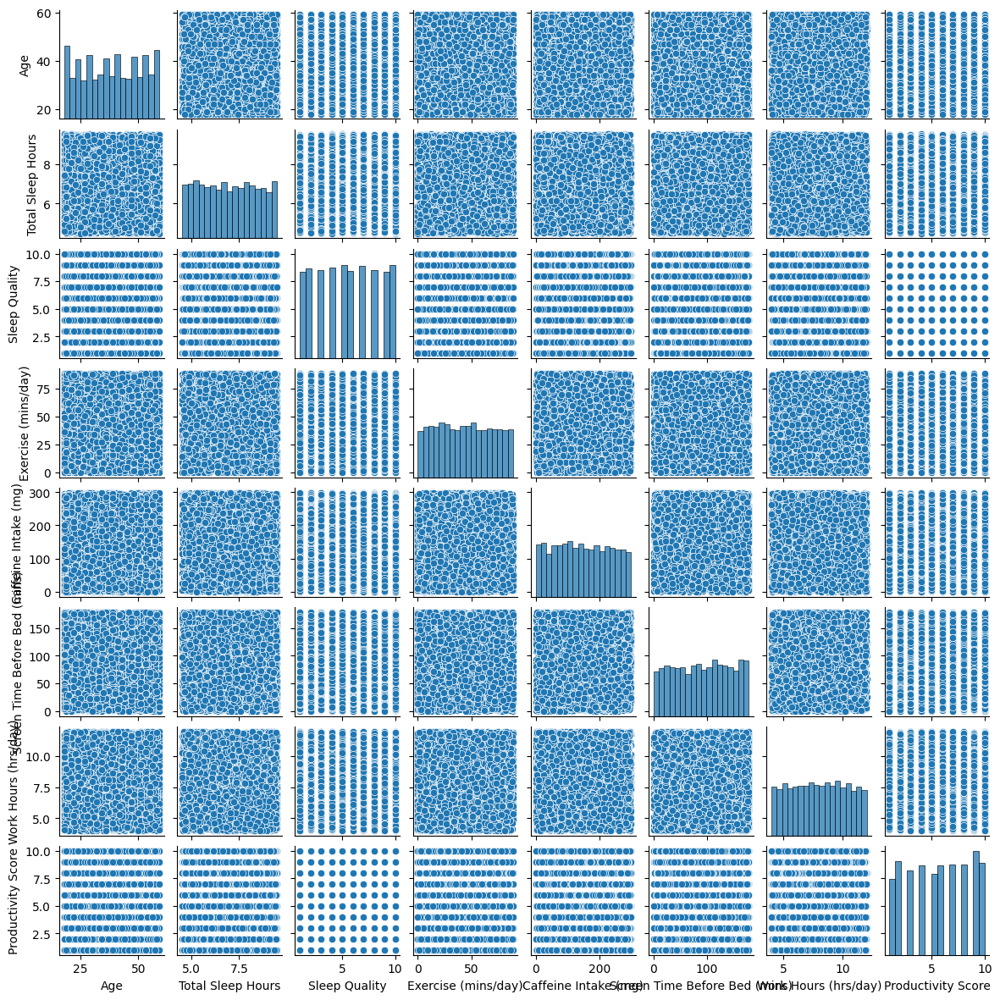

In [14]:
sns.pairplot(df, height=1.5)

In [23]:
columnas = ['Age', 'Gender', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)']

fig = px.box(df, y=columnas, title="Boxplot Sleep Cycle & Productivity", points="all")#,color="Productivity Score")
fig.show()


In [24]:
# Ajustar el tamaño de la figura
#plt.figure(figsize=(12, 6))

# Crear el boxplot
#sns.boxplot(data=df)

# Personalizar etiquetas
#plt.xticks(rotation=45)  # Rotar etiquetas en el eje X si es necesario
#plt.title("Boxplot de 8 Variables")
#plt.grid(True)

# Mostrar el gráfico
#plt.show()

In [9]:
df['Gender'] = df['Gender'].astype('category').cat.codes
correlacion = df.corr()
correlacion

,Age,Gender,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score
Age,1.000000,0.019150,-0.011092,-0.006160,0.009525,-0.001473,-0.008662,0.007713,-0.008369
Gender,0.019150,1.000000,-0.003960,0.014434,-0.020152,-0.026874,0.005754,-0.015997,-0.016093
Total Sleep Hours,-0.011092,-0.003960,1.000000,0.002390,0.017514,0.020274,0.005732,-0.022910,0.018885
Sleep Quality,-0.006160,0.014434,0.002390,1.000000,0.000570,0.000669,0.002062,-0.014777,-0.001155
Exercise (mins/day),0.009525,-0.020152,0.017514,0.000570,1.000000,0.015268,-0.005794,-0.000429,-0.024903
Caffeine Intake (mg),-0.001473,-0.026874,0.020274,0.000669,0.015268,1.000000,0.009154,0.000893,0.005058
Screen Time Before Bed (mins),-0.008662,0.005754,0.005732,0.002062,-0.005794,0.009154,1.000000,0.005476,0.003703
Work Hours (hrs/day),0.007713,-0.015997,-0.022910,-0.014777,-0.000429,0.000893,0.005476,1.000000,-0.016263
Productivity Score,-0.008369,-0.016093,0.018885,-0.001155,-0.024903,0.005058,0.003703,-0.016263,1.000000


<Axes: >

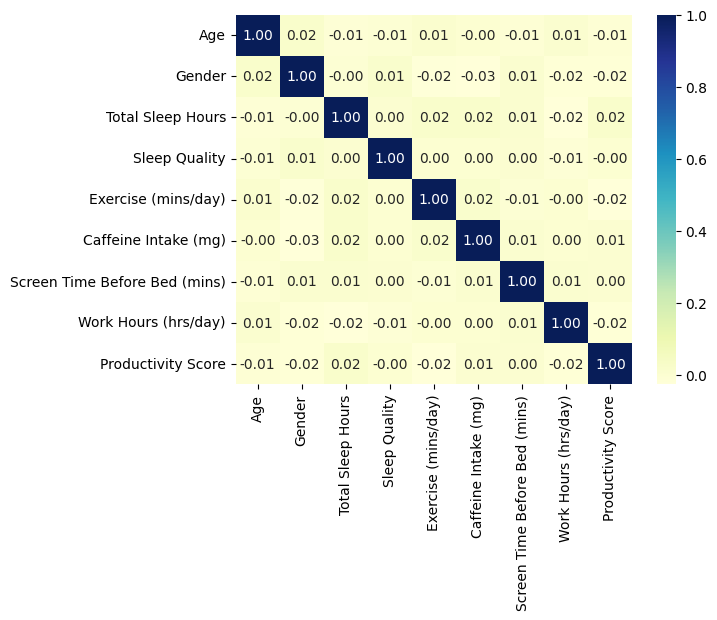

In [31]:
sns.heatmap(correlacion,  annot=True, fmt=".2f",cmap="YlGnBu")

In [11]:
# StandarScaler(). Normaliz rest Media y / desv. estand.
scaler = StandardScaler()
df_Norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df_Norm.head()


,Age,Gender,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score
0,-0.535753,1.251248,-1.165773,-0.880303,1.629612,-0.695752,0.471998,0.360819,0.820283
1,0.195861,-1.217671,-1.076357,-0.181872,-0.463739,-1.464778,-0.065699,-0.728647,1.516678
2,-1.511238,0.016789,-1.117626,0.516560,-1.045226,-0.684100,-0.622600,0.227832,1.516678
3,-0.129301,1.251248,0.395559,0.865776,0.078981,-1.313304,-0.219327,-0.842728,0.820283
4,0.602313,1.251248,-0.154690,1.564208,0.660468,1.424896,0.049522,1.488513,0.820283


<Axes: >

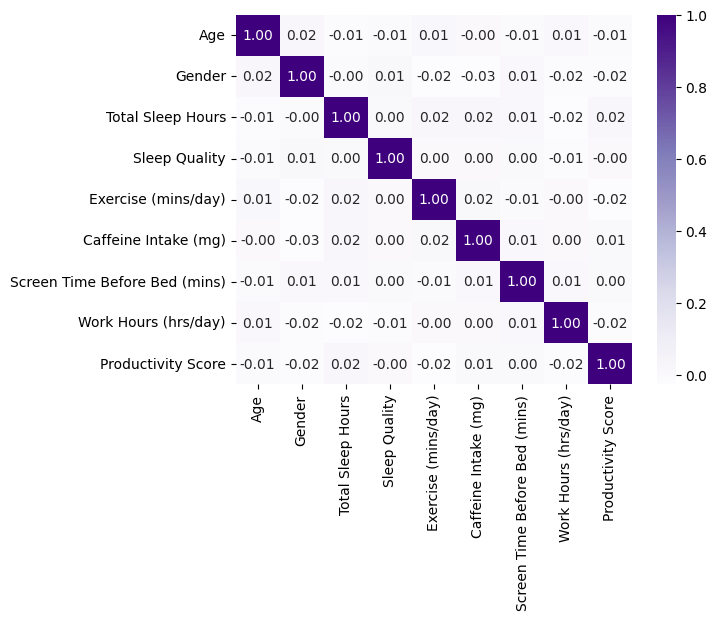

In [30]:
corr = df_Norm.corr()
#corr
sns.heatmap(corr,  annot=True, fmt=".2f",cmap="Purples")

In [21]:
columnas = ['Age', 'Gender', 'Total Sleep Hours', 'Sleep Quality',
       'Exercise (mins/day)', 'Caffeine Intake (mg)',
       'Screen Time Before Bed (mins)', 'Work Hours (hrs/day)']

fig = px.box(df_Norm, y=columnas, title="Boxplot Sleep Cycle & Productivity", points="all")
fig.show()

#No hay mejora con Normalización. Se debe evaluar con otro tipo de correlación


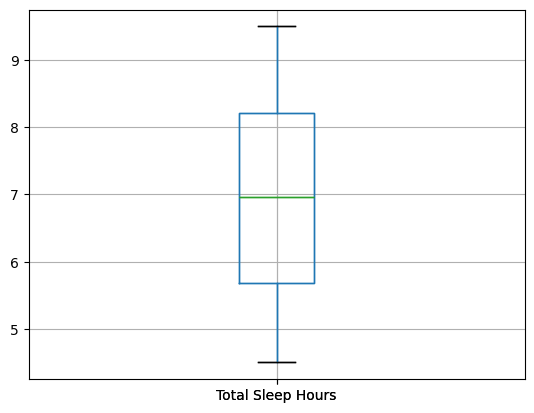

In [5]:
from matplotlib import pyplot as plt
df.boxplot(column='Total Sleep Hours')we

plt.show()


<Axes: >

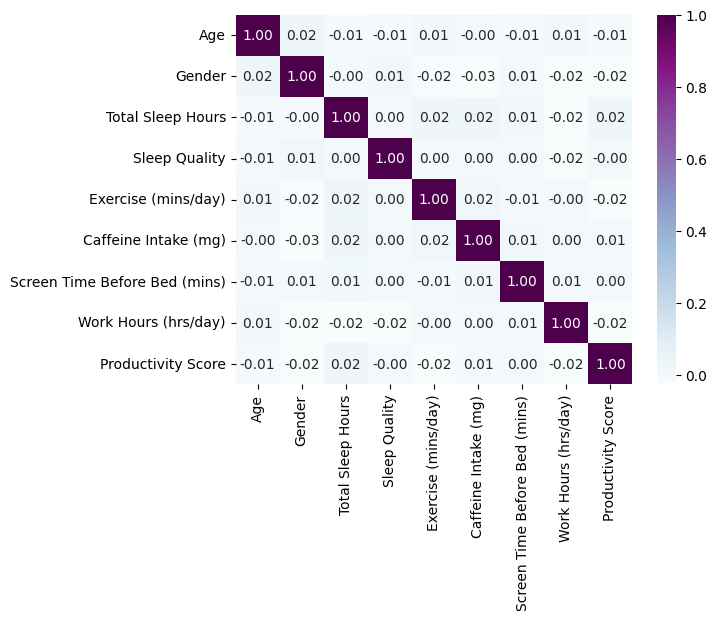

In [29]:
# Correlación Spearman -> datos con relacion no lineal y lineal
corr_sp = df.corr(method='spearman')
sns.heatmap(corr_sp,  annot=True, fmt=".2f",cmap='BuPu')

In [33]:
df.describe()

,Age,Gender,Total Sleep Hours,Sleep Quality,Exercise (mins/day),Caffeine Intake (mg),Screen Time Before Bed (mins),Work Hours (hrs/day),Productivity Score
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000
mean,38.590600,0.986400,6.974902,5.520800,43.962600,146.71140,91.421200,7.987873,5.644200
std,12.302799,0.810152,1.454033,2.863845,25.798541,85.83139,52.079123,2.275734,2.872221
min,18.000000,0.000000,4.500000,1.000000,0.000000,0.00000,0.000000,4.000067,1.000000
25%,28.000000,0.000000,5.690000,3.000000,22.000000,73.00000,46.000000,6.032720,3.000000
50%,39.000000,1.000000,6.960000,5.000000,44.000000,144.00000,92.000000,7.998295,6.000000
75%,49.000000,2.000000,8.210000,8.000000,66.000000,220.00000,136.000000,9.905024,8.000000
max,59.000000,2.000000,9.500000,10.000000,89.000000,299.00000,179.000000,11.999141,10.000000
